# Translation + Scaling
***

# Import from Github

In [1]:
# !git clone https://github.com/ihsaan-ullah/fair-universe
# %cd fair-universe/starting_kit

# Imports

In [2]:
import os
import numpy as np
import pandas as pd
from sys import path
from copy import deepcopy
import warnings
warnings.filterwarnings("ignore")

## Directories

In [3]:
model_dir = 'sample_code_submission/'
result_dir = 'sample_result_submission/' 
problem_dir = 'ingestion_program/'  
score_dir = 'scoring_program/'

### Add directories to path

In [4]:
path.append(model_dir) 
path.append(problem_dir)
path.append(score_dir)
path.append("../Data_Generator")

***
# 0 - Generate Data
***

**Imports**

In [5]:
from data_loader import get_settings_from_json
from data_generator_new import DataGenerator

In [6]:
data_gen_settings = get_settings_from_json('data_jsons/scaling')
for index, settings in enumerate(data_gen_settings):
    data_gen = DataGenerator(settings_dict=settings)
    data_gen.load_settings()
    data_gen.generate_data()
    data_gen.save_data(directory="sample_data", file_index=index+1)
    

***
# 1 - Import Data
***

In [7]:
from data_io import load_data, show_data_statistics, write

In [8]:
data_name = 'fair_universe_challenge'
data_dir = 'sample_data' 

In [9]:
train_sets, test_sets, settings = load_data(data_dir, load_settings=True)



###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  sample_data
[*] train data dir :  sample_data/train/data
[*] train labels dir :  sample_data/train/labels
[*] test data dir :  sample_data/test/data
[*] test labels dir :  sample_data/test/labels
[*] settings dir :  sample_data/settings
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] settings dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------




### Data Statistics

In [10]:
show_data_statistics(train_sets, name="Train")

###-------------------------------------###
### Data Statistics Train
###-------------------------------------###
-------------------
Set 1
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 2
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 3
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 4
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 5
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 6
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199


In [11]:
show_data_statistics(test_sets, name="Test")

###-------------------------------------###
### Data Statistics Test
###-------------------------------------###
-------------------
Set 1
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 2
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 3
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 4
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 5
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199
-------------------
Set 6
-------------------
[*] Total points:  1999
[*] Background points:  1800
[*] Signal points:  199


**Data Visualization**

In [12]:
from visualize import (
    visualize_decicion_boundary,
    visualize_augmented_data,
    visualize_data,
    visualize_clocks,
    visualize_score
)

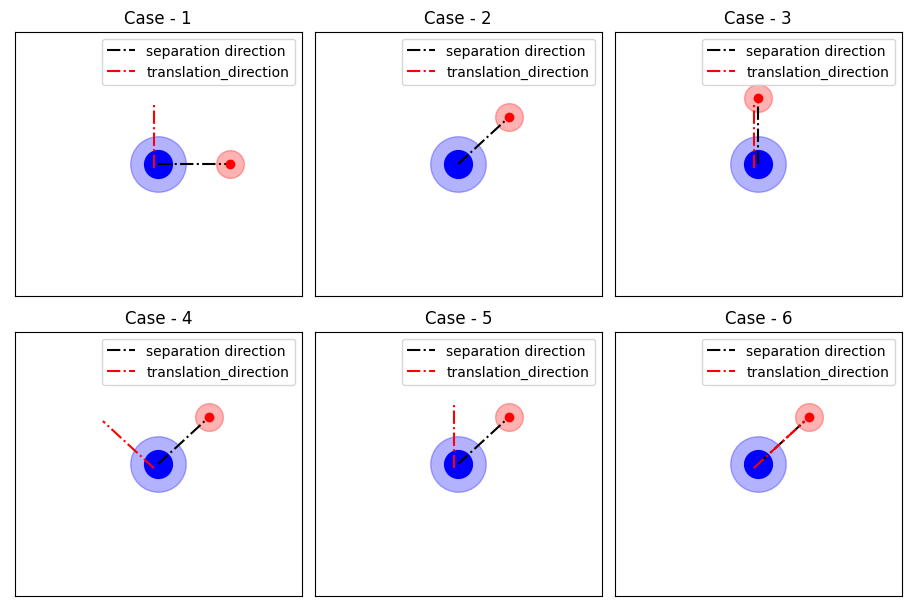

In [13]:
visualize_clocks(settings)

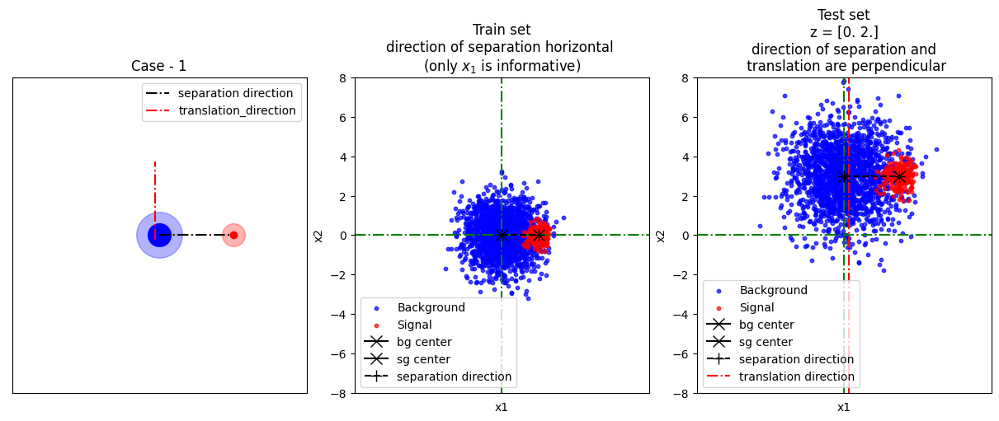

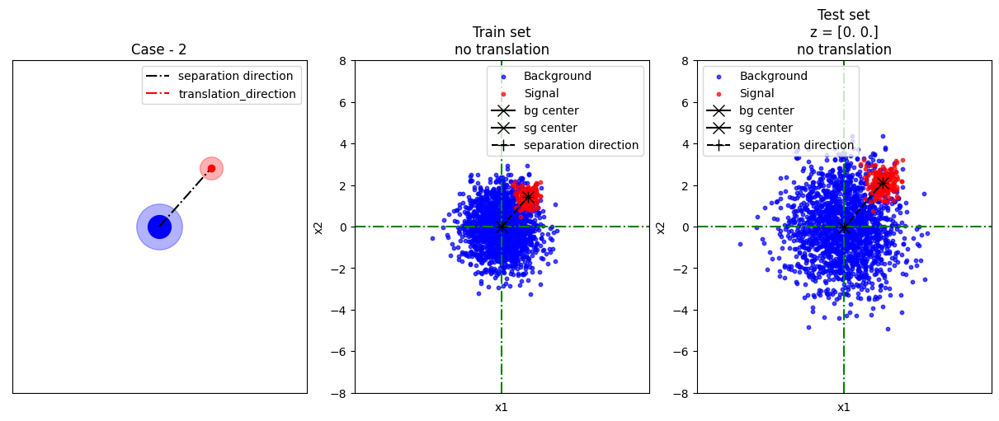

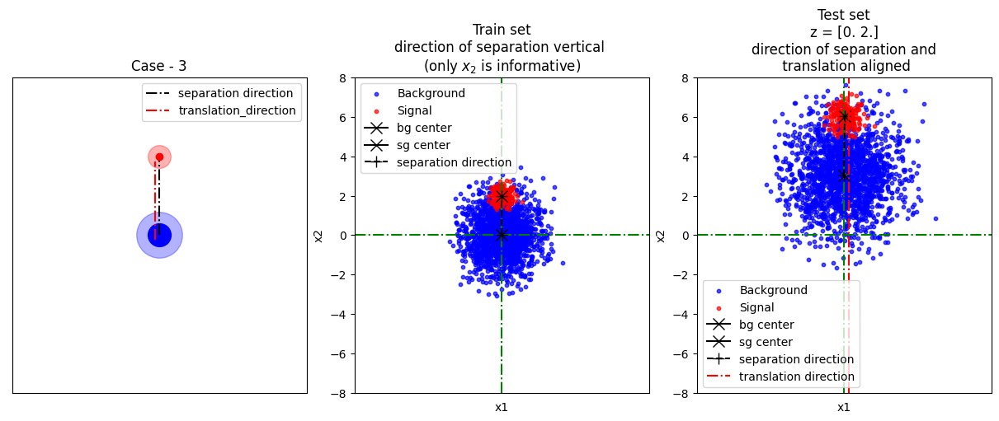

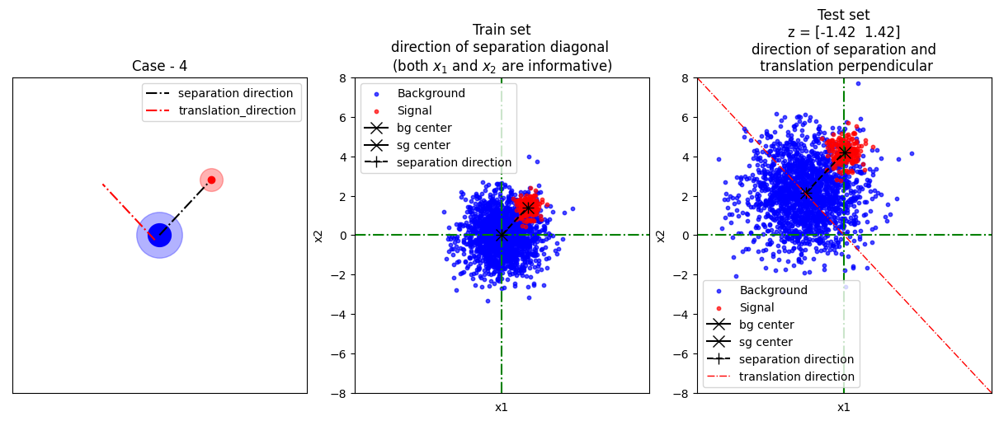

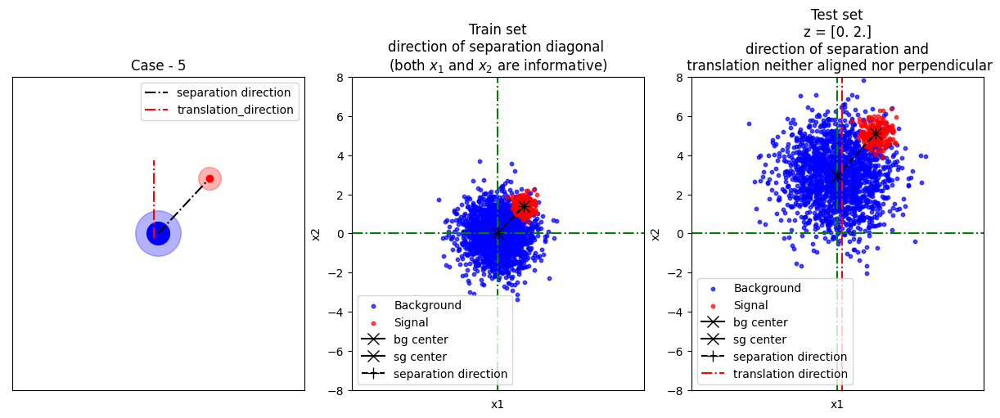

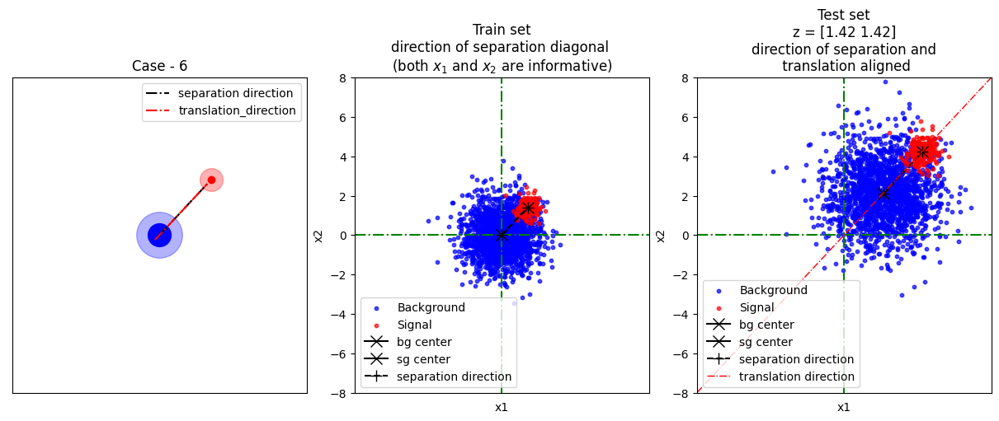

In [14]:
for index, _ in enumerate(train_sets):
    visualize_data(settings[index], train_sets[index], test_sets[index])

***
# 2 - Data Augmentation
***

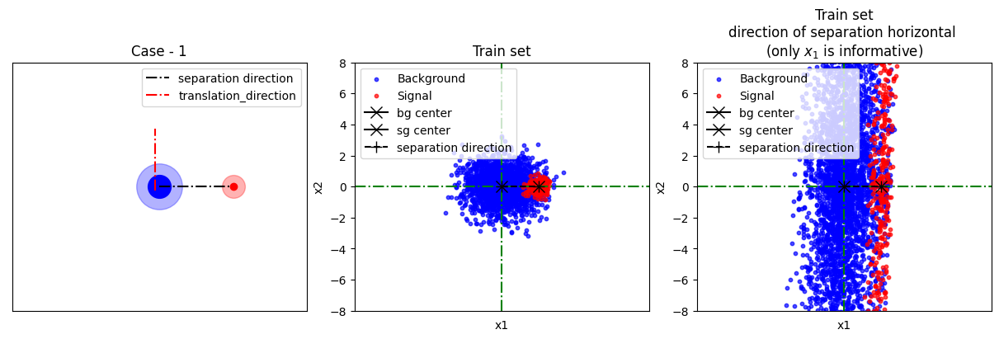

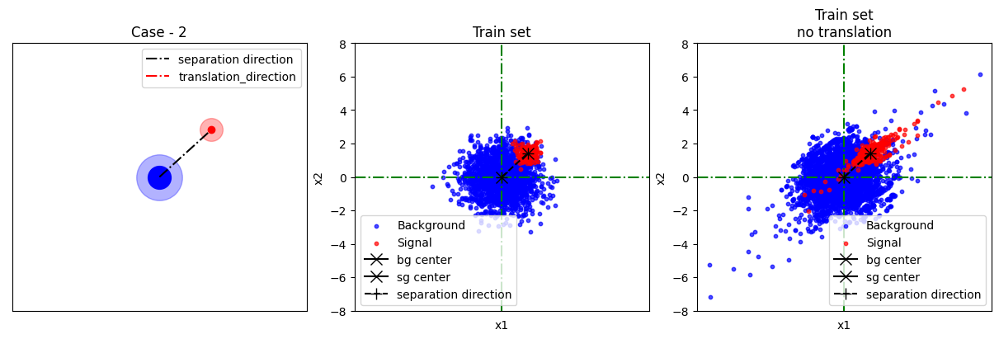

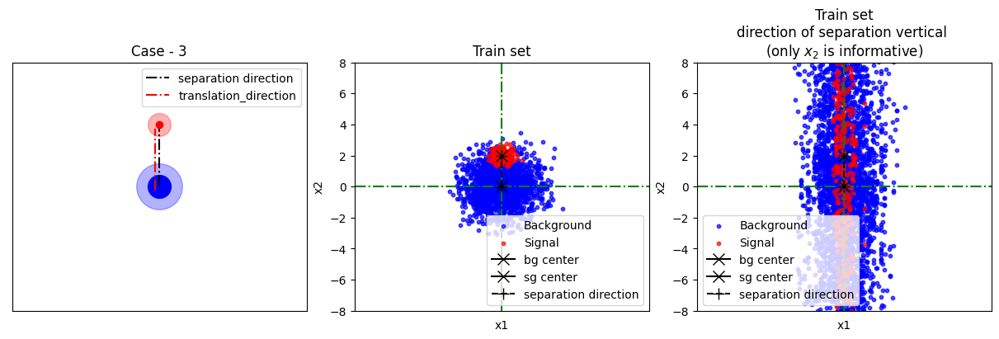

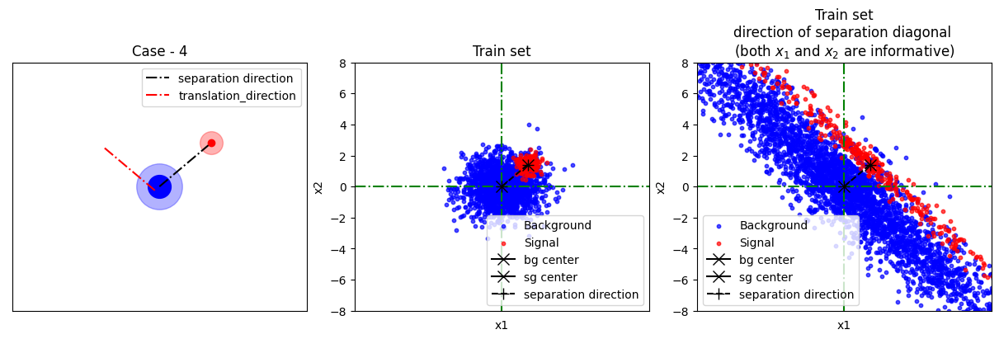

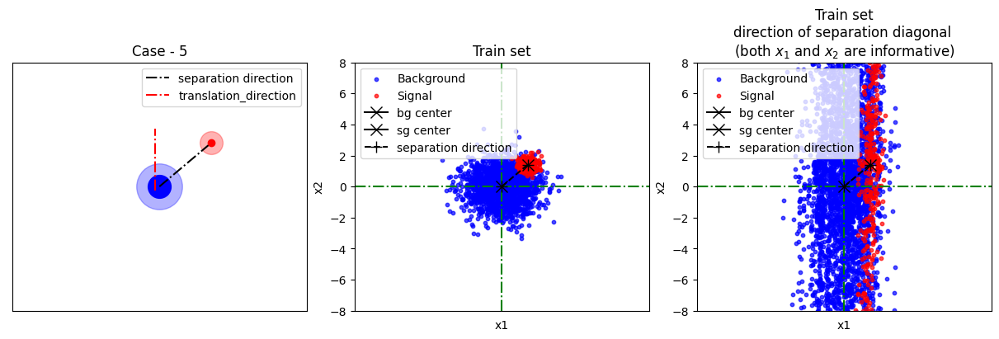

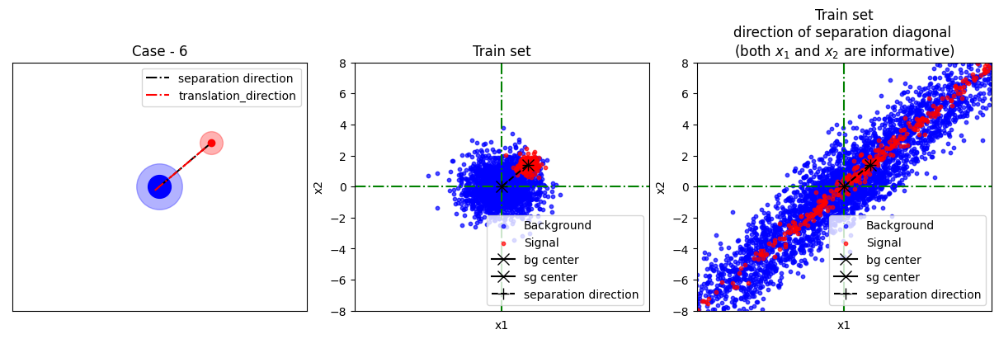

In [15]:
from augment_data import get_augmented_data

for i, _ in enumerate(train_sets):
    augmented_set = get_augmented_data(train_sets[i],  test_sets[i])
    visualize_augmented_data(settings[i], train_sets[i], augmented_set)

***
# 3 - Preprocessing
***

In [16]:
train_sets_preprocessed, test_sets_preprocessed = [], []
for train_set, test_set in zip(train_sets, test_sets):
    
    train_mean = np.mean(train_set["data"]).values
    test_mean = np.mean(test_set["data"]).values

    train_sets_preprocessed.append({
        "data" : train_set["data"] + train_mean - test_mean, 
        "labels" : train_set["labels"] 
    })

    test_sets_preprocessed.append({
        "data" : test_set["data"] + train_mean - test_mean, 
        "labels" : test_set["labels"] 
    })


***
# 4 - Baselines
***

In this section, we introduce the following baselines:

1. Constant model
2. NB plain
3. NB preprocessing
4. LDA plain
5. RR plain
6. NB data augmentation
7. LDA data augmentation
8. RR data augmentatio

**Import Model and Scoring function**

In [17]:
from model import Model
from metric import auc_metric, bac_metric

**Model Names and settings**

In [18]:
model_settings = [
    {"display_name" : "constant model", "model_name": "Constant", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : False},
    {"display_name" : "NB plain", "model_name": "NB", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : False},
    {"display_name" : "NB preprocessing", "model_name": "NB", "preprocessing" : True, "preprocessing_method" : "scaling", "data_augmentation" : False},
    {"display_name" : "LDA plain", "model_name": "LDA", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : False},
    {"display_name" : "RR plain", "model_name": "RR", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : False},
    {"display_name" : "NB data augmentation", "model_name": "NB", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : True},
    {"display_name" : "LDA data augmentation", "model_name": "LDA", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : True},
    {"display_name" : "RR data augmentation", "model_name": "RR", "preprocessing" : False, "preprocessing_method" : "scaling", "data_augmentation" : True}
]

**Train and Test**  

- Load Data
- Train Model
- Get Predictions
- Get Score
- Get Metric Scores
- Save Predictions
- Save Scores


In [19]:
#---------------------------------
# Load Data
#---------------------------------
# Train set
X_Trains = [train_set["data"] for train_set in train_sets]
Y_Trains = [train_set["labels"] for train_set in train_sets]

# Test set
X_Tests = [test_set["data"] for test_set in test_sets]
Y_Tests = [test_set["labels"] for test_set in test_sets]


print("############################################")
print("### Training Program")
print("############################################")

#---------------------------------
# Loop over model settings
#---------------------------------
results = []
for model_setting in model_settings:

    print("\n--------------------------------------------")
    print("[*] Model : {} --- Preprocessing: {} --- Data Augmentation: {}".format(model_setting["model_name"], model_setting["preprocessing"], model_setting["data_augmentation"]))
    print("--------------------------------------------")
    #---------------------------------
    # Predictions Directory
    #---------------------------------
    # result directory 
    predictions_dir = os.path.join(result_dir, model_setting["model_name"])
    # create result directory if not created
    if not os.path.exists(predictions_dir):
        os.mkdir(predictions_dir) 

    #---------------------------------
    # Loop over datasets
    #---------------------------------
    trained_models = []
    Y_hat_trains, Y_hat_score_trains = [], []
    Y_hat_tests, Y_hat_score_tests = [], []
    auc_trains, auc_tests, bac_trains, bac_tests = [],[],[],[]
    for index, _ in enumerate(X_Trains):

        print("\n\tDataset : {}".format(index+1))
        print("\t----------------")

        #---------------------------------
        # Constant predictions for Constatnt model
        #---------------------------------
        if model_setting["model_name"] == "Constant":

            # Get Predictions
            print("\t[*] Get Predictions")
            Y_hat_trains.append(np.zeros(X_Trains[index].shape[0]))
            Y_hat_tests.append(np.zeros(X_Tests[index].shape[0]))
            
            # Get Scores
            print("\t[*] Get Scores")
            Y_hat_score_trains.append(np.zeros(X_Trains[index].shape[0]))
            Y_hat_score_tests.append(np.zeros(X_Tests[index].shape[0]))

            trained_models.append(None)

            
        #---------------------------------
        # All other models
        #---------------------------------
        else:
            # model_name 
            trained_model_name = model_dir + model_setting["model_name"]

            #---------------------------------
            # Load Model
            #---------------------------------
            print("\t[*] Loading Model")
            model = Model(
                model_setting["model_name"],
                X_Trains[index],
                Y_Trains[index],
                X_Tests[index],
                model_setting["preprocessing"],
                model_setting["preprocessing_method"],
                model_setting["data_augmentation"]
            )
            # Load Trained Model 
            # model = model.load(trained_model_name) 

            #---------------------------------
            # Train Model
            #---------------------------------
            # Train model if not trained
            print("\t[*] Training Model")
            if not(model.is_trained):
                model.fit() 

            #---------------------------------
            # Get Predictions
            #---------------------------------
            print("\t[*] Get Predictions")
            Y_hat_trains.append(model.predict(X_Trains[index]))
            Y_hat_tests.append(model.predict())
            
            #---------------------------------
            # Get Scores/Proba
            #---------------------------------
            print("\t[*] Get Scores")
            Y_hat_score_trains.append(model.decision_function(X_Trains[index]))
            Y_hat_score_tests.append(model.decision_function())

            trained_models.append(model)

        #---------------------------------
        # Get Metric Scores
        #---------------------------------
        print("\t[*] Computing Scores using AUC and BAC")
        auc_trains.append(round(auc_metric(Y_Trains[index], Y_hat_score_trains[-1]), 2))
        auc_tests.append(round(auc_metric(Y_Tests[index], Y_hat_score_tests[-1]), 2))
        bac_trains.append(round(bac_metric(Y_Trains[index], Y_hat_trains[-1]), 2))
        bac_tests.append(round(bac_metric(Y_Tests[index], Y_hat_tests[-1]), 2))


        #---------------------------------
        # Save Predictions
        #---------------------------------
        print("\t[*] Saving Predictions and Scores")
        # prediction file name
        prediction_name_train = os.path.join(predictions_dir, "train_"+ str(index+1) + ".predictions")
        prediction_name_test = os.path.join(predictions_dir, "test_"+ str(index+1) + ".predictions")

        # score file name
        score_name_train = os.path.join(predictions_dir, "train_"+ str(index+1) + ".scores")
        score_name_test = os.path.join(predictions_dir, "test_"+ str(index+1) + ".scores")
        
        # save prediction
        write(prediction_name_train, Y_hat_score_trains[-1])
        write(prediction_name_test, Y_hat_score_tests[-1])

        # save score
        write(score_name_train, Y_hat_score_trains[-1])
        write(score_name_test, Y_hat_score_tests[-1])
    


    
    results.append({
        "trained_models" : trained_models,
        "Y_hat_trains" : Y_hat_trains,
        "Y_hat_tests" : Y_hat_tests,
        "Y_hat_score_trains" : Y_hat_score_trains,
        "Y_hat_score_tests" : Y_hat_score_tests,
        "auc_trains" : auc_trains,
        "auc_tests" : auc_tests,
        "bac_trains" : bac_trains,
        "bac_tests" : bac_tests,
    })

############################################
### Training Program
############################################

--------------------------------------------
[*] Model : Constant --- Preprocessing: False --- Data Augmentation: False
--------------------------------------------

	Dataset : 1
	----------------
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 2
	----------------
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 3
	----------------
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 4
	----------------
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	Dataset : 5
	----------------
	[*] Get Predictions
	[*] Get Scores
	[*] Computing Scores using AUC and BAC
	[*] Saving Predictions and Scores

	D

***
# 5 - Decision Boundaries
***

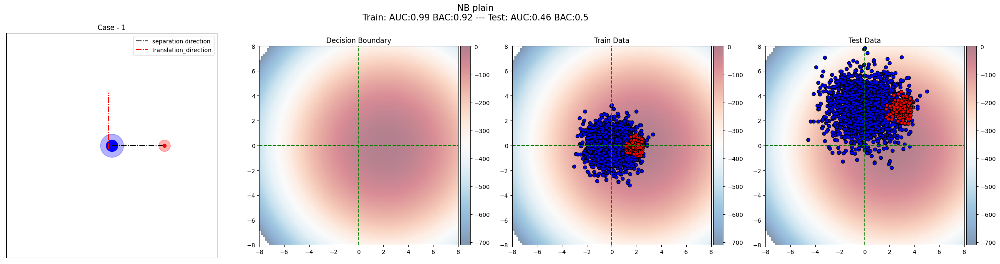

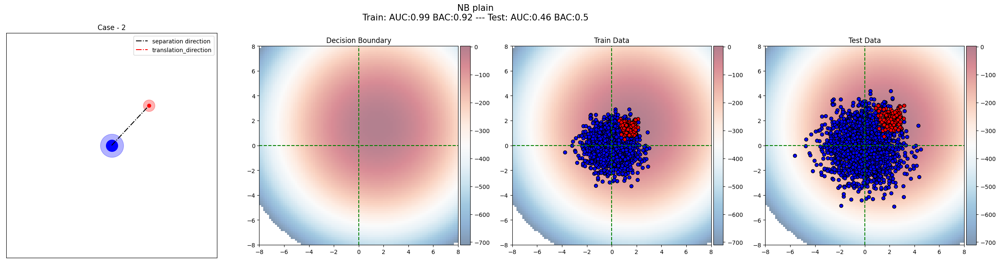

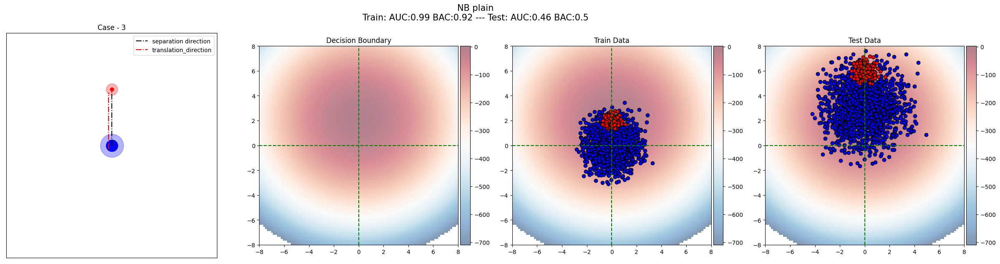

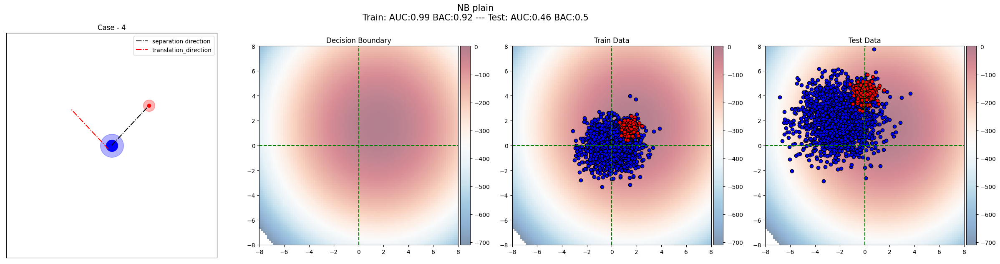

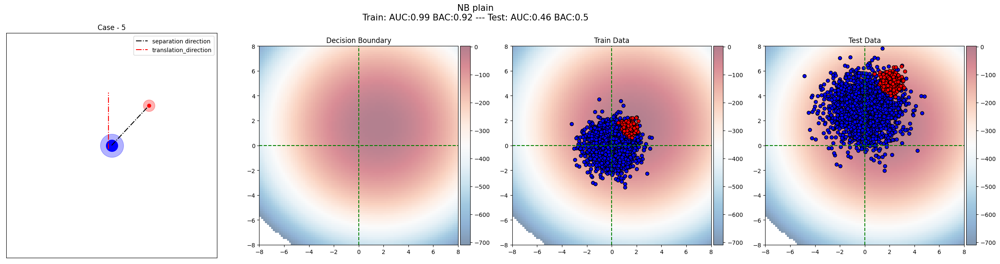

...

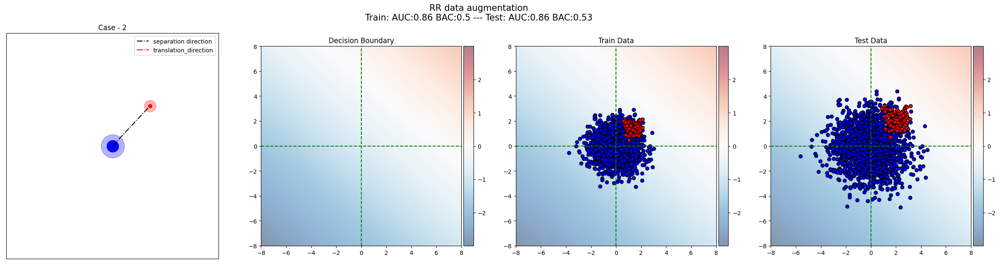

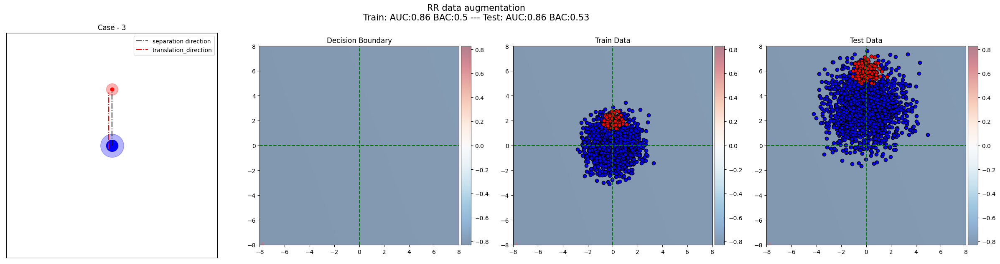

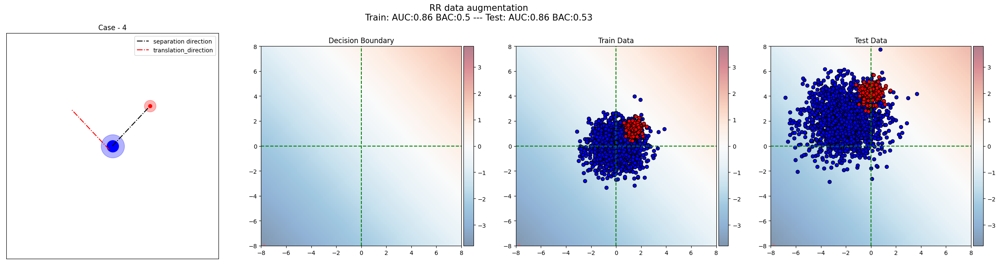

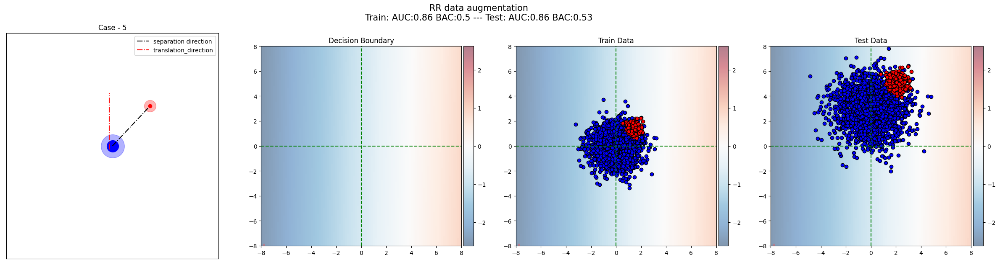

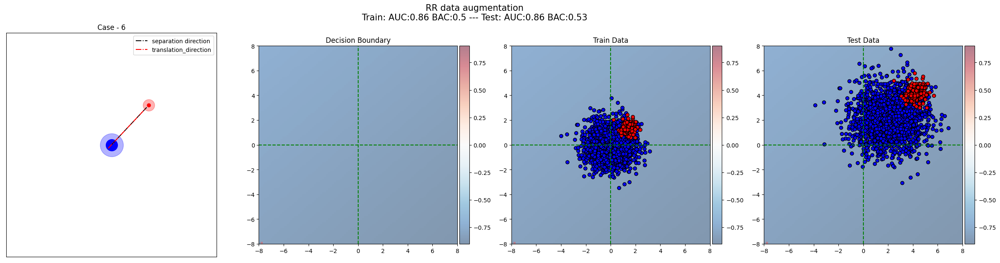

In [20]:
for model_s, result in zip(model_settings, results):
    if model_s["model_name"] != "Constant":
        if model_s["preprocessing"]:
            visualize_decicion_boundary(model_s["display_name"], settings, result, train_sets, test_sets_preprocessed)
        else:
            visualize_decicion_boundary(model_s["display_name"], settings, result, train_sets, test_sets)

***
# 6 - Scoring
***

In [21]:
train_columns = ["train_set 1", "train_set 2", "train_set 3", "train_set 4", "train_set 5", "train_set 6"]
test_columns = ["test_set 1", "test_set 2", "test_set 3", "test_set 4", "test_set 5", "test_set 6"]


train_aucs, test_aucs, train_bacs, test_bacs, indexes = [],[],[],[],[]
for model_s, result in zip(model_settings, results):
    indexes.append(model_s["display_name"])
    train_aucs.append(result["auc_trains"])
    test_aucs.append(result["auc_tests"])
    train_bacs.append(result["bac_trains"])
    test_bacs.append(result["bac_tests"])


score_auc_df_train = pd.DataFrame(data=train_aucs, columns=train_columns, index=indexes)
score_auc_df_test = pd.DataFrame(data=test_aucs, columns=test_columns, index=indexes)
score_bac_df_train = pd.DataFrame(data=train_bacs, columns=train_columns, index=indexes)
score_bac_df_test = pd.DataFrame(data=test_bacs, columns=test_columns, index=indexes)

score_auc_df_train["avg_auc"] = round(score_auc_df_train.iloc[:, 0:6].mean(axis=1), 2)
score_auc_df_test["avg_auc"] = round(score_auc_df_test.iloc[:, 0:6].mean(axis=1), 2)
score_bac_df_train["avg_bac"] = round(score_bac_df_train.iloc[:, 0:6].mean(axis=1), 2)
score_bac_df_test["avg_bac"] = round(score_bac_df_test.iloc[:, 0:6].mean(axis=1), 2)

score_auc_df_train.to_csv("scoring_output/auc_train.csv")
score_auc_df_test.to_csv("scoring_output/auc_test.csv")
score_bac_df_train.to_csv("scoring_output/bac_train.csv")
score_bac_df_test.to_csv("scoring_output/bac_test.csv")


In [22]:
score_auc_df_train

,train_set 1,train_set 2,train_set 3,train_set 4,train_set 5,train_set 6,avg_auc
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50
NB plain,0.99,0.99,0.99,0.99,0.99,0.99,0.99
NB preprocessing,0.99,0.99,0.99,0.99,0.99,0.99,0.99
LDA plain,0.97,0.97,0.97,0.97,0.98,0.97,0.97
RR plain,0.97,0.97,0.97,0.97,0.98,0.97,0.97
NB data augmentation,0.97,0.98,0.81,0.97,0.92,0.97,0.94
LDA data augmentation,0.97,0.97,0.73,0.97,0.91,0.56,0.85
RR data augmentation,0.97,0.97,0.76,0.97,0.91,0.57,0.86


In [23]:
score_auc_df_test

,test_set 1,test_set 2,test_set 3,test_set 4,test_set 5,test_set 6,avg_auc
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50
NB plain,0.73,0.93,0.06,0.74,0.21,0.07,0.46
NB preprocessing,0.99,0.99,0.99,0.99,0.99,0.99,0.99
LDA plain,0.97,0.97,0.97,0.97,0.98,0.97,0.97
RR plain,0.97,0.97,0.97,0.97,0.98,0.97,0.97
NB data augmentation,0.97,0.98,0.81,0.96,0.92,0.97,0.94
LDA data augmentation,0.97,0.97,0.73,0.97,0.91,0.56,0.85
RR data augmentation,0.97,0.97,0.76,0.97,0.91,0.57,0.86


In [24]:
score_bac_df_train

,train_set 1,train_set 2,train_set 3,train_set 4,train_set 5,train_set 6,avg_bac
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50
NB plain,0.92,0.92,0.93,0.91,0.93,0.93,0.92
NB preprocessing,0.91,0.92,0.91,0.90,0.90,0.91,0.91
LDA plain,0.76,0.72,0.73,0.70,0.78,0.74,0.74
RR plain,0.50,0.50,0.50,0.50,0.50,0.50,0.50
NB data augmentation,0.50,0.91,0.50,0.50,0.50,0.50,0.57
LDA data augmentation,0.72,0.51,0.50,0.65,0.50,0.50,0.56
RR data augmentation,0.50,0.50,0.50,0.50,0.50,0.50,0.50


In [25]:
score_bac_df_test

,test_set 1,test_set 2,test_set 3,test_set 4,test_set 5,test_set 6,avg_bac
constant model,0.50,0.50,0.50,0.50,0.50,0.50,0.50
NB plain,0.50,0.61,0.45,0.50,0.48,0.45,0.50
NB preprocessing,0.91,0.92,0.91,0.90,0.90,0.91,0.91
LDA plain,0.94,0.95,0.63,0.94,0.73,0.62,0.80
RR plain,0.78,0.70,0.76,0.71,0.85,0.74,0.76
NB data augmentation,0.84,0.94,0.50,0.50,0.50,0.50,0.63
LDA data augmentation,0.94,0.83,0.50,0.94,0.62,0.50,0.72
RR data augmentation,0.60,0.50,0.50,0.56,0.50,0.50,0.53


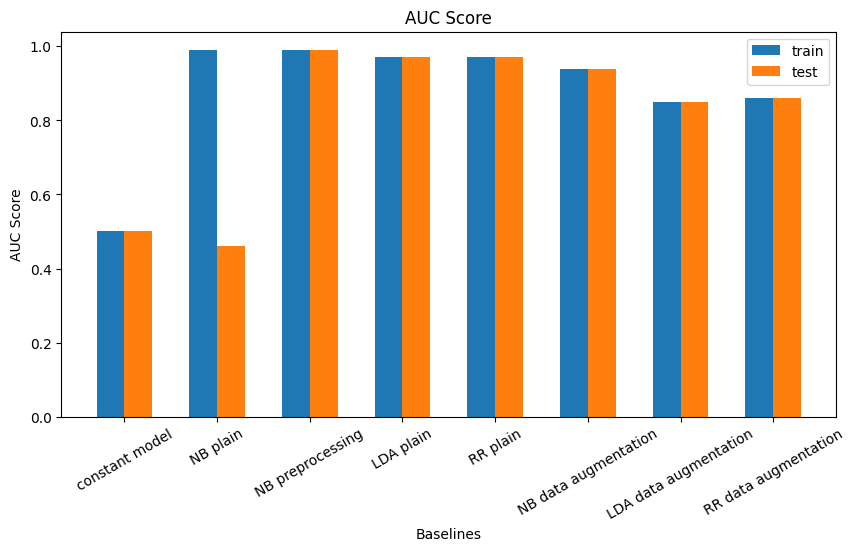

In [26]:
visualize_score(score_auc_df_train, score_auc_df_test, "AUC Score")

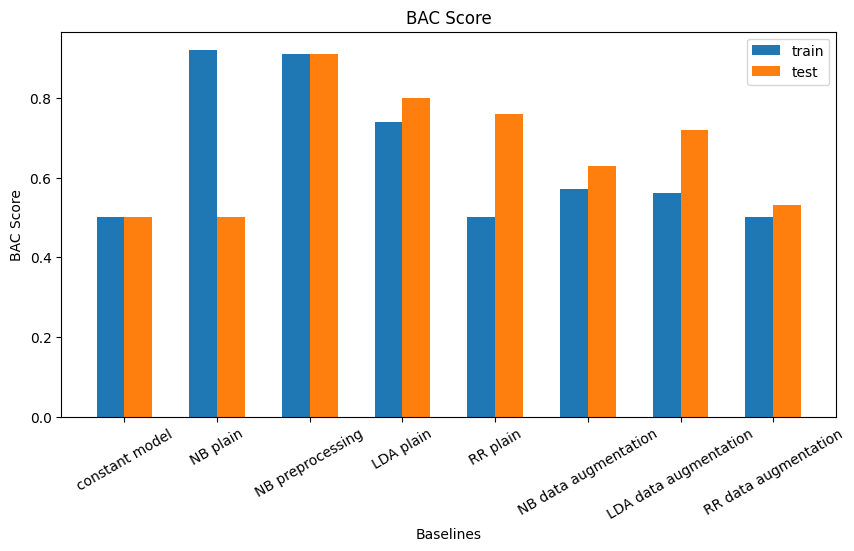

In [27]:
visualize_score(score_bac_df_train, score_bac_df_test, "BAC Score")

***
# 7 - Submissions
***

### Unit Testing 

It is <b><span style="color:red">important that you test your submission files before submitting them</span></b>. All you have to do to make a submission is modify the file <code>model.py</code> in the <code>sample_code_submission/</code> directory, then run this test to make sure everything works fine. This is the actual program that will be run on the server to test your submission. 
<br>
Keep the sample code simple.<br>

<code>python3</code> is required for this step

**Test Ingestion Program**

In [28]:
!python3 $problem_dir/ingestion.py

############################################
### Ingestion Program
############################################


###-------------------------------------###
### Data Loading
###-------------------------------------###

[*] data dir :  ./sample_data
[*] train data dir :  ./sample_data/train/data
[*] train labels dir :  ./sample_data/train/labels
[*] test data dir :  ./sample_data/test/data
[*] test labels dir :  ./sample_data/test/labels
[+] train data dir found
[+] train labels dir found
[+] test data dir found
[+] test labels dir found
[+] 6 train and test sets found
---------------------------------
[+] Train and Test data loaded!
---------------------------------



[*] Dataset : 1
-----------
[*] Loading Model
[*] Training Model
[*] Making Predictions
[*] Saving Predictions
[*] Saving Scores

[*] Dataset : 2
-----------
[*] Loading Model
[*] Training Model
[*] Making Predictions
[*] Saving Predictions
[*] Saving Scores

[*] Dataset : 3
-----------
[*] Loading Model
[*] Training Mo

**Test Scoring Program**

In [29]:
!python3 $score_dir/score.py

############################################
### Scoring Program
############################################
[*] Reading predictions and solutions
[*] Predictions files : ['test_6.predictions', 'test_3.predictions', 'test_5.predictions', 'test_2.predictions', 'test_4.predictions', 'test_1.predictions']
[*] Score files : ['test_3.scores', 'test_1.scores', 'test_5.scores', 'test_2.scores', 'test_4.scores', 'test_6.scores']
[*] Solutions files : ['test_3.labels', 'test_1.labels', 'test_5.labels', 'test_2.labels', 'test_4.labels', 'test_6.labels']
[+] 6 prediction, score, solution files found
---------------------------------
[+] Predictions and Solution files loaded!
---------------------------------


[*] Computing AUC and BAC scores

Test set 1
-----------
AUC: 0.73
BAC: 0.5

Test set 2
-----------
AUC: 0.93
BAC: 0.61

Test set 3
-----------
AUC: 0.06
BAC: 0.45

Test set 4
-----------
AUC: 0.74
BAC: 0.5

Test set 5
-----------
AUC: 0.21
BAC: 0.48

Test set 6
-----------
AUC: 0.07
BAC: 

### Prepare the submission

In [30]:
import datetime 
from data_io import zipdir
the_date = datetime.datetime.now().strftime("%y-%m-%d-%H-%M")
code_submission = 'code_submission_' + the_date + '.zip'
# sample_result_submission = '../sample_result_submission_' + the_date + '.zip'
zipdir(code_submission, model_dir)
# zipdir(sample_result_submission, result_dir)
print("Submit : " + code_submission + " to the compeition: https://www.codabench.org/competitions/674/")

Submit : code_submission_23-03-17-18-43.zip to the compeition: https://www.codabench.org/competitions/674/


Sample Code Submission is generated in the directory: `fair-universe/starting_kit/`